FILTRO BAYER SOBRE IMAGEN A COLOR - CON ROJO Y AZUL INTENSIFICADOS

🎯 Cada píxel CONSERVA SU COLOR ORIGINAL pero solo se muestra el canal correspondiente
   a su posición en el filtro Bayer, con rojo y azul intensificados

1. FILTRO BAYER con rojo x2.0, azul x2.0:


C:\Users\Estudiante\AppData\Local\Temp\ipykernel_12948\2002195531.py:177: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\Estudiante\AppData\Local\Temp\ipykernel_12948\2002195531.py:177: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\Estudiante\AppData\Local\Temp\ipykernel_12948\2002195531.py:177: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


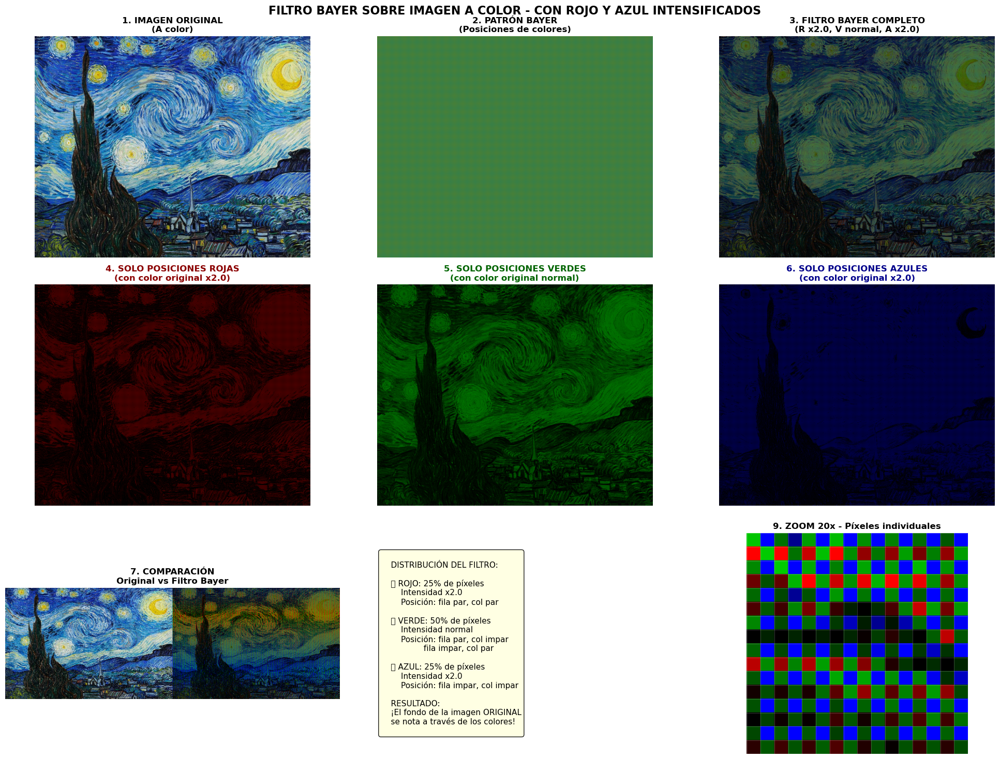


2. Prueba de diferentes intensidades:


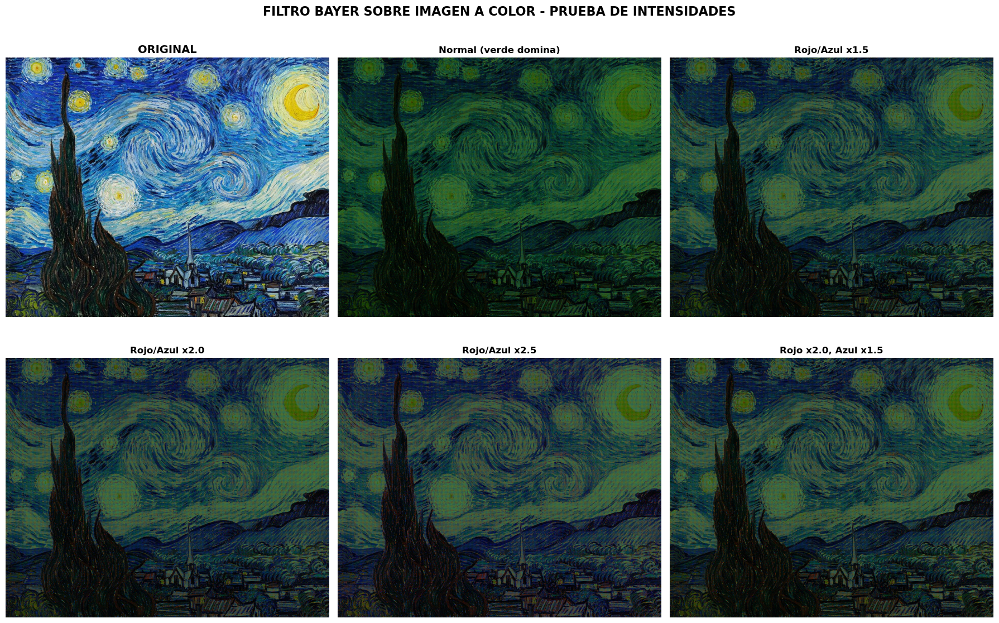


✅ RESULTADO:
   - La imagen ORIGINAL A COLOR se nota de fondo
   - Los píxeles rojos y azules están intensificados x2.0
   - Se ve claramente el patrón de cuadrícula del filtro Bayer


In [45]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def filtro_bayer_con_color_original(imagen_path, intensidad_rojo=2.0, intensidad_azul=2.0):
    """
    FILTRO BAYER aplicado a IMAGEN A COLOR:
    - Cada píxel conserva su color original pero SOLO el canal correspondiente a su posición
    - Rojo y azul se INTENSIFICAN para compensar su menor cantidad de píxeles
    - El fondo de la imagen ORIGINAL se nota a través de los colores
    """
    # Cargar imagen A COLOR
    img = cv2.imread(imagen_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    h, w = img_rgb.shape[:2]
    
    # Separar canales originales (a float para poder multiplicar)
    r_original = img_rgb[:, :, 0].astype(np.float32)
    g_original = img_rgb[:, :, 1].astype(np.float32)
    b_original = img_rgb[:, :, 2].astype(np.float32)
    
    # Aplicar intensidades a rojo y azul
    r_intenso = np.clip(r_original * intensidad_rojo, 0, 255).astype(np.uint8)
    g_normal = g_original.astype(np.uint8)
    b_intenso = np.clip(b_original * intensidad_azul, 0, 255).astype(np.uint8)
    
    # Crear filtros para cada canal
    filtro_rojo = np.zeros_like(img_rgb)
    filtro_verde = np.zeros_like(img_rgb)
    filtro_azul = np.zeros_like(img_rgb)
    filtro_completo = np.zeros_like(img_rgb)
    
    # Imagen que muestra SOLO las posiciones (para ver el patrón)
    patron_posiciones = np.zeros_like(img_rgb)
    
    for i in range(h):
        for j in range(w):
            # Determinar color según posición (para el patrón)
            if i % 2 == 0:  # Fila par
                if j % 2 == 0:  # Col par - ROJO
                    color_texto = 'R'
                    # En el filtro rojo: poner el valor rojo intensificado
                    filtro_rojo[i, j, 0] = r_intenso[i, j]
                    # En el filtro completo: poner el valor rojo intensificado
                    filtro_completo[i, j, 0] = r_intenso[i, j]
                    # Patrón de posiciones (color puro para ver la cuadrícula)
                    patron_posiciones[i, j, 0] = 255
                else:  # Col impar - VERDE
                    color_texto = 'G'
                    # En el filtro verde: poner el valor verde normal
                    filtro_verde[i, j, 1] = g_normal[i, j]
                    # En el filtro completo: poner el valor verde normal
                    filtro_completo[i, j, 1] = g_normal[i, j]
                    # Patrón de posiciones
                    patron_posiciones[i, j, 1] = 255
            else:  # Fila impar
                if j % 2 == 0:  # Col par - VERDE
                    color_texto = 'G'
                    # En el filtro verde: poner el valor verde normal
                    filtro_verde[i, j, 1] = g_normal[i, j]
                    # En el filtro completo: poner el valor verde normal
                    filtro_completo[i, j, 1] = g_normal[i, j]
                    # Patrón de posiciones
                    patron_posiciones[i, j, 1] = 255
                else:  # Col impar - AZUL
                    color_texto = 'B'
                    # En el filtro azul: poner el valor azul intensificado
                    filtro_azul[i, j, 2] = b_intenso[i, j]
                    # En el filtro completo: poner el valor azul intensificado
                    filtro_completo[i, j, 2] = b_intenso[i, j]
                    # Patrón de posiciones
                    patron_posiciones[i, j, 2] = 255
    
    # Mostrar resultados
    plt.figure(figsize=(20, 15))
    
    # 1. Imagen original
    plt.subplot(3, 3, 1)
    plt.imshow(img_rgb)
    plt.title('1. IMAGEN ORIGINAL\n(A color)', fontsize=12, fontweight='bold')
    plt.axis('off')
    
    # 2. Patrón de posiciones (para ver la cuadrícula)
    plt.subplot(3, 3, 2)
    plt.imshow(patron_posiciones)
    plt.title('2. PATRÓN BAYER\n(Posiciones de colores)', fontsize=12, fontweight='bold')
    plt.axis('off')
    
    # 3. Filtro completo
    plt.subplot(3, 3, 3)
    plt.imshow(filtro_completo)
    plt.title(f'3. FILTRO BAYER COMPLETO\n(R x{intensidad_rojo}, V normal, A x{intensidad_azul})', 
              fontsize=12, fontweight='bold')
    plt.axis('off')
    
    # 4. Solo ROJO (con color original intensificado)
    plt.subplot(3, 3, 4)
    plt.imshow(filtro_rojo)
    plt.title(f'4. SOLO POSICIONES ROJAS\n(con color original x{intensidad_rojo})', 
              fontsize=12, fontweight='bold', color='darkred')
    plt.axis('off')
    
    # 5. Solo VERDE (con color original normal)
    plt.subplot(3, 3, 5)
    plt.imshow(filtro_verde)
    plt.title('5. SOLO POSICIONES VERDES\n(con color original normal)', 
              fontsize=12, fontweight='bold', color='darkgreen')
    plt.axis('off')
    
    # 6. Solo AZUL (con color original intensificado)
    plt.subplot(3, 3, 6)
    plt.imshow(filtro_azul)
    plt.title(f'6. SOLO POSICIONES AZULES\n(con color original x{intensidad_azul})', 
              fontsize=12, fontweight='bold', color='darkblue')
    plt.axis('off')
    
    # 7. Comparación: Original vs Filtro (lado a lado)
    plt.subplot(3, 3, 7)
    comparacion = np.hstack([
        cv2.resize(img_rgb, (300, 200)),
        cv2.resize(filtro_completo, (300, 200))
    ])
    plt.imshow(comparacion)
    plt.title('7. COMPARACIÓN\nOriginal vs Filtro Bayer', fontsize=12, fontweight='bold')
    plt.axis('off')
    
    # 8. Información de distribución
    plt.subplot(3, 3, 8)
    info = f"""
    DISTRIBUCIÓN DEL FILTRO:
    
    🔴 ROJO: 25% de píxeles
        Intensidad x{intensidad_rojo}
        Posición: fila par, col par
    
    🟢 VERDE: 50% de píxeles
        Intensidad normal
        Posición: fila par, col impar
                 fila impar, col par
    
    🔵 AZUL: 25% de píxeles
        Intensidad x{intensidad_azul}
        Posición: fila impar, col impar
    
    RESULTADO:
    ¡El fondo de la imagen ORIGINAL
    se nota a través de los colores!
    """
    plt.text(0.1, 0.5, info, fontsize=11, verticalalignment='center',
             bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.9))
    plt.axis('off')
    
    # 9. Zoom de una región
    plt.subplot(3, 3, 9)
    # Tomar una región pequeña
    region = filtro_completo[h//2-8:h//2+8, w//2-8:w//2+8]
    # Hacer zoom
    zoom_factor = 20
    zoom = np.zeros((region.shape[0]*zoom_factor, region.shape[1]*zoom_factor, 3), dtype=np.uint8)
    for i in range(region.shape[0]):
        for j in range(region.shape[1]):
            zoom[i*zoom_factor:(i+1)*zoom_factor, j*zoom_factor:(j+1)*zoom_factor] = region[i, j]
    
    plt.imshow(zoom)
    plt.title(f'9. ZOOM {zoom_factor}x - Píxeles individuales', fontsize=12, fontweight='bold')
    plt.axis('off')
    
    # Cuadrícula en el zoom
    for i in range(0, zoom.shape[0], zoom_factor):
        plt.axhline(y=i, color='white', linewidth=0.5, alpha=0.3)
    for j in range(0, zoom.shape[1], zoom_factor):
        plt.axvline(x=j, color='white', linewidth=0.5, alpha=0.3)
    
    plt.suptitle(f'FILTRO BAYER SOBRE IMAGEN A COLOR - CON ROJO Y AZUL INTENSIFICADOS', 
                fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return filtro_completo

def probar_diferentes_intensidades_color(imagen_path):
    """
    Prueba diferentes intensidades para rojo y azul sobre la imagen a color
    """
    img = cv2.imread(imagen_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img_rgb.shape[:2]
    
    # Separar canales
    r = img_rgb[:, :, 0].astype(np.float32)
    g = img_rgb[:, :, 1].astype(np.float32)
    b = img_rgb[:, :, 2].astype(np.float32)
    
    # Combinaciones a probar
    combinaciones = [
        (1.0, 1.0, "Normal (verde domina)"),
        (1.5, 1.5, "Rojo/Azul x1.5"),
        (2.0, 2.0, "Rojo/Azul x2.0"),
        (2.5, 2.5, "Rojo/Azul x2.5"),
        (2.0, 1.5, "Rojo x2.0, Azul x1.5"),
        (1.5, 2.0, "Rojo x1.5, Azul x2.0")
    ]
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    
    # Original
    axes[0, 0].imshow(img_rgb)
    axes[0, 0].set_title('ORIGINAL', fontsize=14, fontweight='bold')
    axes[0, 0].axis('off')
    
    for idx, (int_r, int_b, desc) in enumerate(combinaciones[:5]):
        # Crear filtro
        r_int = np.clip(r * int_r, 0, 255).astype(np.uint8)
        b_int = np.clip(b * int_b, 0, 255).astype(np.uint8)
        g_norm = g.astype(np.uint8)
        
        filtro = np.zeros_like(img_rgb)
        for i in range(h):
            for j in range(w):
                if i % 2 == 0:
                    if j % 2 == 0:
                        filtro[i, j, 0] = r_int[i, j]
                    else:
                        filtro[i, j, 1] = g_norm[i, j]
                else:
                    if j % 2 == 0:
                        filtro[i, j, 1] = g_norm[i, j]
                    else:
                        filtro[i, j, 2] = b_int[i, j]
        
        row, col = (idx + 1) // 3, (idx + 1) % 3
        axes[row, col].imshow(filtro)
        axes[row, col].set_title(f'{desc}', fontsize=12, fontweight='bold')
        axes[row, col].axis('off')
    
    axes[1, 2].axis('off')
    plt.suptitle('FILTRO BAYER SOBRE IMAGEN A COLOR - PRUEBA DE INTENSIDADES', 
                fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

# EJECUCIÓN
if __name__ == "__main__":
    imagen_path = 'paisaje.jpg'  # Tu imagen a color
    
    print("="*70)
    print("FILTRO BAYER SOBRE IMAGEN A COLOR - CON ROJO Y AZUL INTENSIFICADOS")
    print("="*70)
    
    print("\n🎯 Cada píxel CONSERVA SU COLOR ORIGINAL pero solo se muestra el canal correspondiente")
    print("   a su posición en el filtro Bayer, con rojo y azul intensificados")
    
    # Versión recomendada
    print("\n1. FILTRO BAYER con rojo x2.0, azul x2.0:")
    resultado = filtro_bayer_con_color_original(imagen_path, intensidad_rojo=2.0, intensidad_azul=2.0)
    
    # Probar diferentes intensidades
    print("\n2. Prueba de diferentes intensidades:")
    probar_diferentes_intensidades_color(imagen_path)
    
    print("\n✅ RESULTADO:")
    print("   - La imagen ORIGINAL A COLOR se nota de fondo")
    print("   - Los píxeles rojos y azules están intensificados x2.0")
    print("   - Se ve claramente el patrón de cuadrícula del filtro Bayer")

UMBRALIZACION DE DOS PICOS

Text(0.5, 1.0, 'umbralizacion otsu')

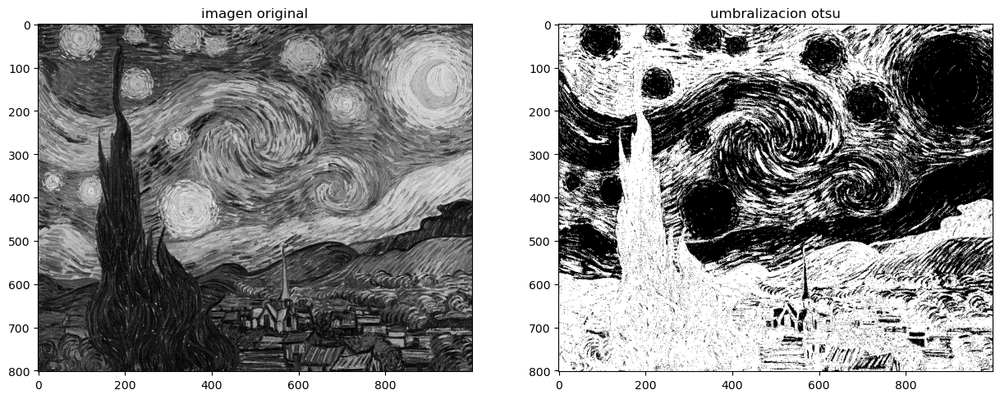

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
def dos_picos(image):
    #calculo de histograma
    hist=cv2.calcHist([image],[0],None,[256],[0,256])#hago uso del histograma
    #seleccionamos los dos picos
    pico=np.array(hist)
    pico=pico.flatten()
    pico_dif=np.diff(pico)#diferencias entre los picos
    primer_pico=np.argmax(pico_dif[:128])#pico hasta 127
    seguno_pico=np.argmax(pico_dif[128:])+128 #pico de 128 para adelante
    #calculo del umbral
    umbral=int((primer_pico+seguno_pico)/2)
    return umbral
imagen=cv2.imread('paisaje.jpg',0)
umbral_2_picos=dos_picos(imagen)
_,nueva=cv2.threshold(imagen,umbral_2_picos,255,cv2.THRESH_BINARY)
plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
plt.imshow(image,cmap='gray')
plt.title('imagen original')
plt.subplot(1,2,2)
plt.imshow(imagen_fin,cmap='gray')
plt.title('umbralizacion de pos picos')


UMBRALIZACION CON OTSU

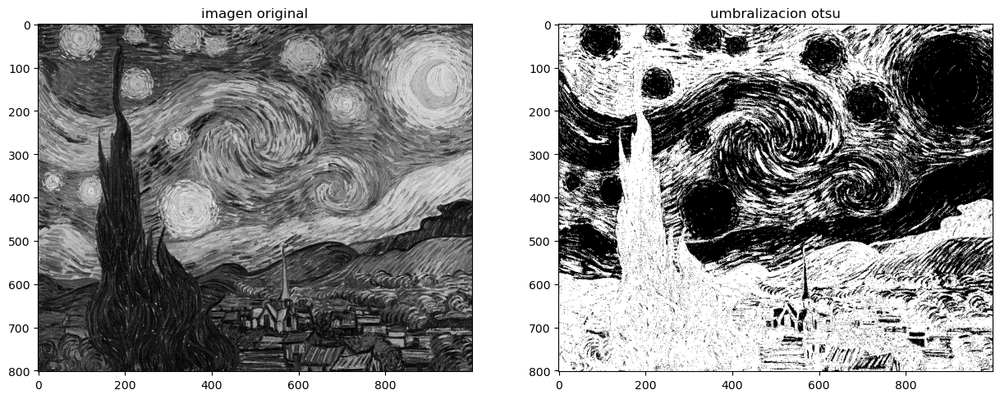

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image=cv2.imread('paisaje.jpg',0)
_,otsu=cv2.threshold(image,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)
imagen_fin=np.where(image>otsu,255,0).astype(np.uint8)
plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
plt.imshow(image,cmap='gray')
plt.title('imagen original')
plt.subplot(1,2,2)
plt.imshow(imagen_fin,cmap='gray')
plt.title('umbralizacion otsu')

plt.show()

VARIABLE CON CV2

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
image = cv2.imread('paisaje.jpg',0)#escala de grises

ventana=15
k=2
imagen_fin=cv2.adaptiveThreshold(image,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,ventana,k)

UMBRALUZACION VARIABLE PARTICION DE UNA IMAGEN

Text(0.5, 1.0, 'umbralizacion VARIABLE PARTICION DE UNA IMAGEN')

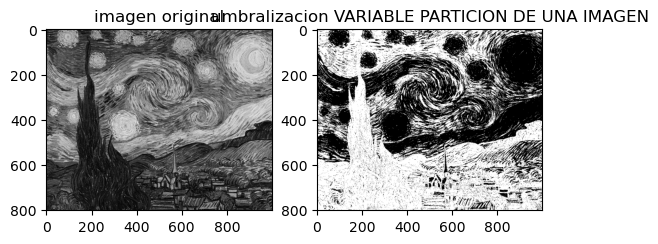

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def variable_part(image,tab_bloque,c):
    umbral_img=np.zeros_like(image)
    for y in range(0,image.shape[0],tam_bloque):#recorremos filas
        for x in range(0,image.shape[1],tam_bloque):#recorremos columnas
            bloque=image[y:y+tam_bloque,x:x+tab_bloque]#extraemos el bloque
            bloq_media=np.mean(bloque)#intensidad de bloque
            umbral=bloq_media-c
            umbral_img[y:y+tab_bloque,x:x+tam_bloque]=(bloque>umbral) + 255
            return umbral_img
    tam_b=25
    c=10
    img=cv2.imread('paisaje.jpg',0)
    img_fin=variable_part(image,tam_b,c)
    plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
plt.imshow(image,cmap='gray')
plt.title('imagen original')
plt.subplot(1,2,2)
plt.imshow(imagen_fin,cmap='gray')
plt.title('umbralizacion VARIABLE PARTICION DE UNA IMAGEN')
    


UMBRALIZACION ISODATA

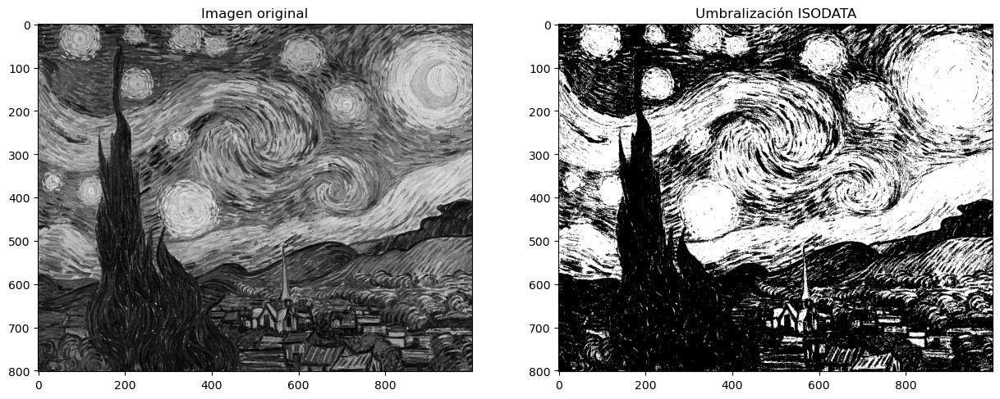

In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def isodata(image):
    umbral = 128
    
    while True:
        grupo1 = image[image <= umbral]
        grupo2 = image[image > umbral]

        media1 = np.mean(grupo1)
        media2 = np.mean(grupo2)

        nuevo_umbral = (media1 + media2) / 2

        if abs(nuevo_umbral - umbral) < 0.5:
            break

        umbral = nuevo_umbral

    return umbral


imagen = cv2.imread('paisaje.jpg', 0)

umbral_isodata = isodata(imagen)

_, umbralizacion_iso = cv2.threshold(imagen, int(umbral_isodata), 255, cv2.THRESH_BINARY)

plt.figure(figsize=(15,7))

plt.subplot(1,2,1)
plt.imshow(imagen, cmap='gray')
plt.title('Imagen original')

plt.subplot(1,2,2)
plt.imshow(umbralizacion_iso, cmap='gray')
plt.title('Umbralización ISODATA')

plt.show()

PROPIEDADES LOCALES

Text(0.5, 1.0, 'umbralizacion propiedades locales')

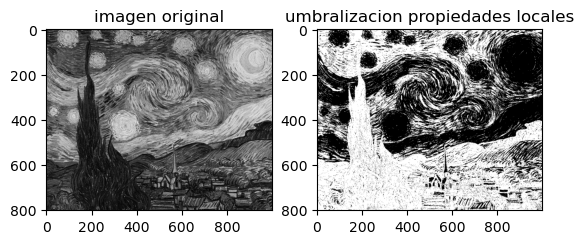

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread('paisaje.jpg',0)#escala de grises
def local (image,tamanio_ventana,k):
    umbr_img=np.zeros_like(image)
    #definir un rastreo de imagen con padding
    pad=tamanio_ventana//2
    padded_image=cv2.copyMakeBorder(image,pad,pad,pad,pad,cv2.BORDER_REPLICATE)
    #recorremos cada pixel
    for y in range(image.shape[0]):
        ventana=padded_image[y:y+tamanio_ventana,x:x+tamanio_ventana]
        #calculo de media y desv
        mean_local=np.mean(ventana)
        std_mean=np.std(ventana)
        #calculo del umbral
        umbral=mean_local-(k*std_mean)
        umbr_img[y,x]= 255 if image[y,x]>umbral else 0
        return umbr_img
    tam_vent=15
    k=2
    img_fin=local(image,tam_vent,k)
    plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
plt.imshow(image,cmap='gray')
plt.title('imagen original')
plt.subplot(1,2,2)
plt.imshow(imagen_fin,cmap='gray')
plt.title('umbralizacion propiedades locales')

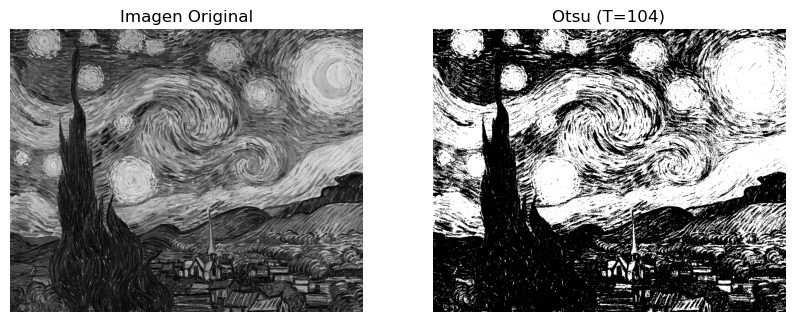

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# ---- Histograma (necesario para tu función) ----
def CalHistogram(I):
    hist = np.zeros(256)
    for pixel in I.flatten():
        hist[pixel] += 1
    return hist


# ---- TU FUNCIÓN (igual que la que enviaste) ----
def OtsuThreshold(I):
    hist = CalHistogram(I)
    total_pixels = I.size

    m0 = 0
    m1 = np.sum(np.arange(256) * hist)
    w0 = 0
    w1 = np.sum(hist)

    max_between_class_variance = 0
    optimal_threshold = 0

    for t in range(1, 256):
        w0 += hist[t - 1]
        w1 -= hist[t - 1]

        m0 += (t - 1) * hist[t - 1]
        m1 -= (t - 1) * hist[t - 1]

        if w0 == 0 or w1 == 0:
            continue

        mean_diff = m0 / w0 - m1 / w1
        between_class_variance = w0 * w1 * mean_diff ** 2

        if between_class_variance > max_between_class_variance:
            max_between_class_variance = between_class_variance
            optimal_threshold = t

    return optimal_threshold


# ---- Cargar imagen ----
ruta = "paisaje.jpg"
img = Image.open(ruta).convert("L")
I = np.array(img)

# ---- Obtener umbral ----
threshold = OtsuThreshold(I)

# ---- Crear imagen binaria ----
I_otsu = np.zeros_like(I)
I_otsu[I >= threshold] = 255
I_otsu[I < threshold] = 0

# ---- Mostrar comparación ----
plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.title("Imagen Original")
plt.imshow(I, cmap='gray')
plt.axis('off')

plt.subplot(1,2,2)
plt.title(f"Otsu (T={threshold})")
plt.imshow(I_otsu, cmap='gray')
plt.axis('off')

plt.show()